In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images
from PIL import Image
import cv2
import numpy as np
!pip install twilio
from twilio.rest import Client

Cloning into 'yolov5'...
remote: Enumerating objects: 16559, done.
remote: Counting objects: 100% (37/37), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 16559 (delta 18), reused 29 (delta 13), pack-reused 16522
Receiving objects: 100% (16559/16559), 15.08 MiB | 29.92 MiB/s, done.
Resolving deltas: 100% (11375/11375), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 34.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 750.8/750.8 kB 43.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imageio 2.31.6 requires pillow<10.1.0,>=8.3.2, but you have pillow 10.3.0 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


Setup complete. Using torch 2.2.1+cu121 (Tesla T4)


In [3]:

from roboflow import Roboflow
rf = Roboflow(api_key="3UbEhry4ZY8n0IlgEpAc")
project = rf.workspace("rathinam-college-of-arts-and-sciences").project("aru-ml-project-ds")
version = project.version(4)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ARU-ML-project-DS-4 in yolov5pytorch:: 100%|██████████| 4490/4490 [00:00<00:00, 8973.12it/s]


In [5]:
%cd /content/yolov5

/content/yolov5


In [6]:
%cat /content/yolov5/ARU-ML-project-DS-4/data.yaml

names:
- dust
- mobile
- pen
- pen mark
- snacks
nc: 5
roboflow:
  license: CC BY 4.0
  project: aru-ml-project-ds
  url: https://universe.roboflow.com/rathinam-college-of-arts-and-sciences/aru-ml-project-ds/dataset/4
  version: 4
  workspace: rathinam-college-of-arts-and-sciences
test: ../test/images
train: ARU-ML-project-DS-4/train/images
val: ARU-ML-project-DS-4/valid/images


In [7]:
!python train.py --img 416 --batch 16 --epochs 50 --data /content/yolov5/ARU-ML-project-DS-4/data.yaml --weights yolov5s.pt --cache


2024-04-18 16:35:45.938396: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-18 16:35:45.938441: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-18 16:35:45.939885: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/ARU-ML-project-DS-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_s

In [8]:
%load_ext tensorboard
%tensorboard --logdir runs


<IPython.core.display.Javascript object>

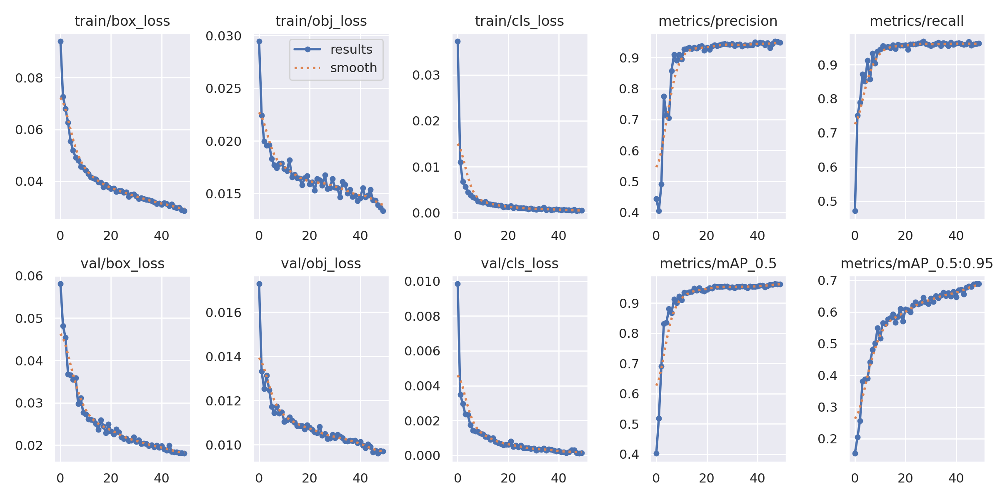

In [20]:
from IPython.display import Image
Image(filename='/content/yolov5/runs/train/exp/results.png', width=1000)

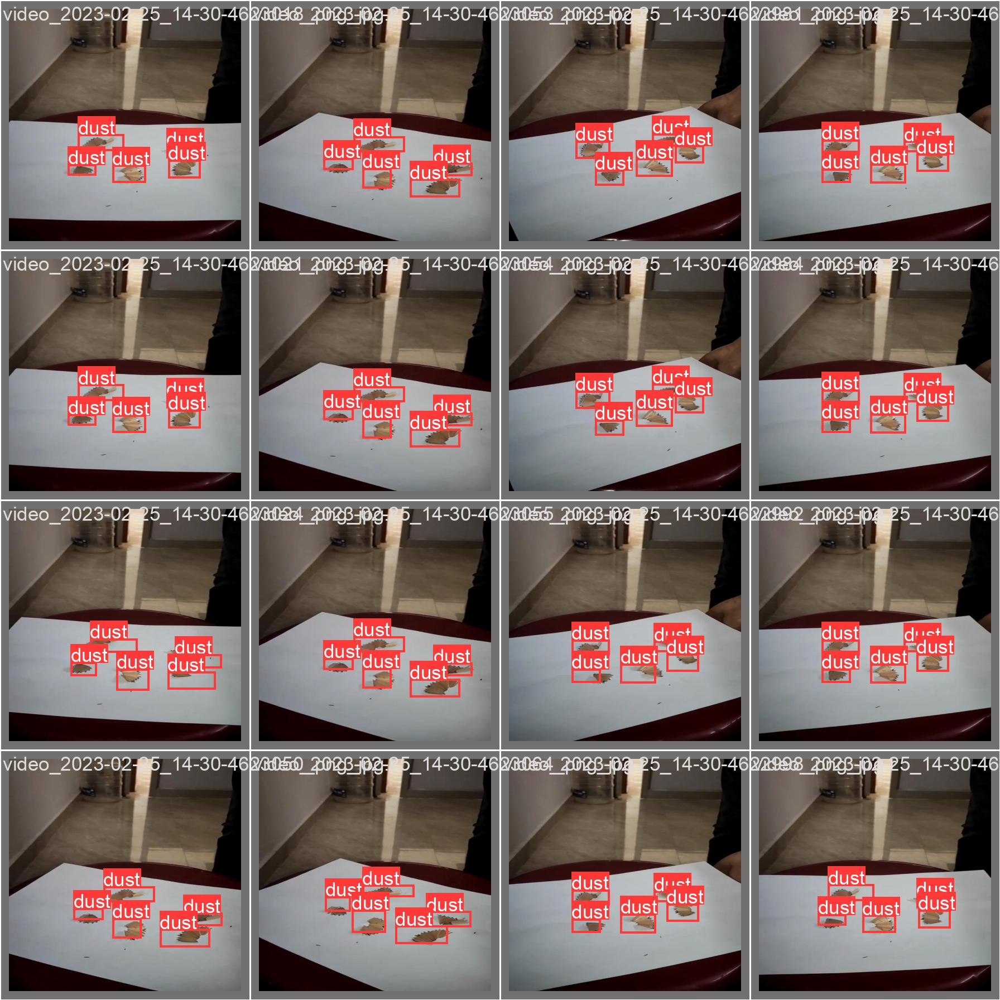

In [21]:
Image(filename='/content/yolov5/runs/train/exp/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


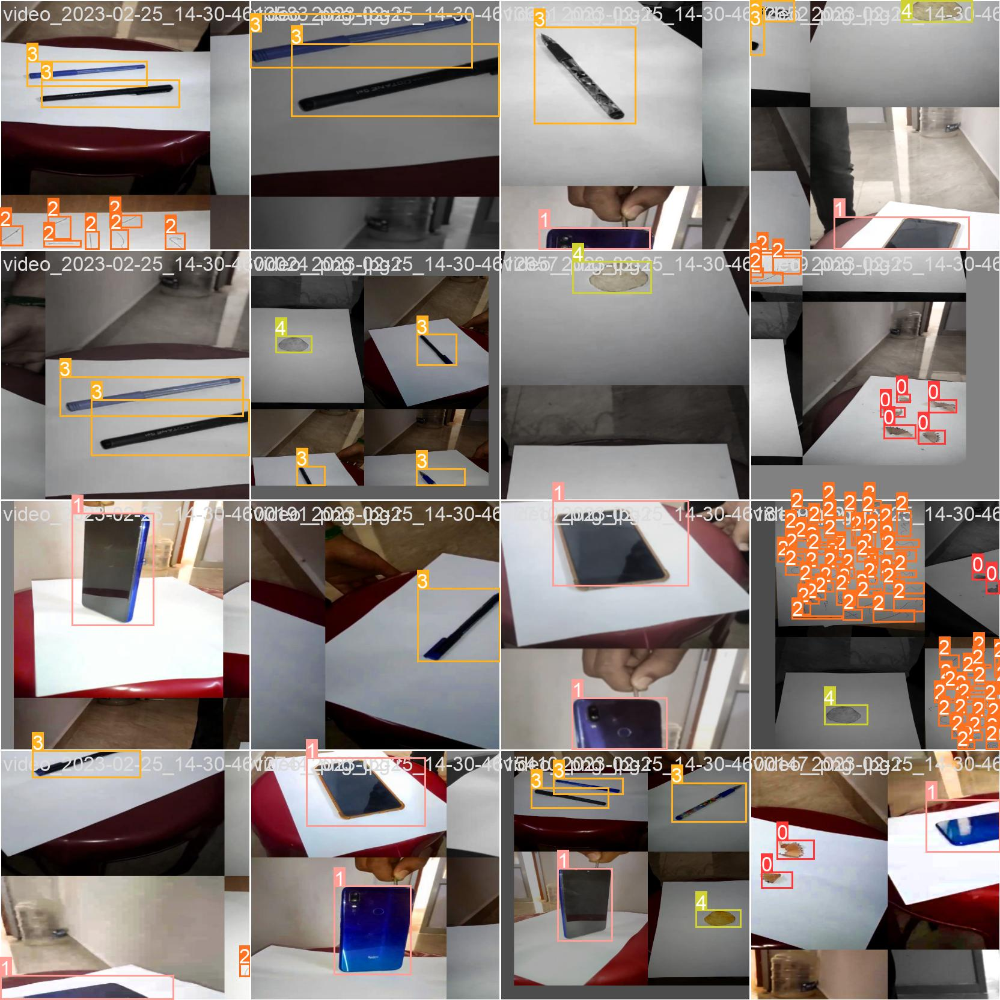

In [22]:
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/exp/train_batch0.jpg', width=900)

In [9]:
account_sid = 'ACbb509787e0848a5766f523154b0c78c5'
auth_token = '4d23bb78fdc74d52a71b39a6c14d9d54'
twilio_phone_number = '+447700177767'
recipient_phone_number = '+447502721146'


In [10]:
client = Client(account_sid, auth_token)

In [11]:
def send_twilio_notification():
    message = client.messages.create(
        body='A student is using a mobile phone in the classroom!',
        from_=twilio_phone_number,
        to=recipient_phone_number
    )
    print('Twilio notification sent!')

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


Setup complete. Using torch 2.2.1+cu121 (Tesla T4)


In [27]:
def check_mobile_detection(output_text):

    lines = output_text.split('\n')


    for line in lines:

        if 'mobile' in line:
            return True

    return False

In [28]:
output= !python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /content/image_4.jpg

if check_mobile_detection('\n'.join(output)):
    send_twilio_notification()


Twilio notification sent!
